In [1]:
!pip install sqlalchemy_mate==2.0.0.0

In [2]:
!pip install uszipcode;

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [4]:
data= pd.read_csv("austinHousingData.csv")

In [5]:
data.shape

(15171, 47)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15171 entries, 0 to 15170
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   zpid                        15171 non-null  int64  
 1   city                        15171 non-null  object 
 2   streetAddress               15171 non-null  object 
 3   zipcode                     15171 non-null  int64  
 4   description                 15169 non-null  object 
 5   latitude                    15171 non-null  float64
 6   longitude                   15171 non-null  float64
 7   propertyTaxRate             15171 non-null  float64
 8   garageSpaces                15171 non-null  int64  
 9   hasAssociation              15171 non-null  bool   
 10  hasCooling                  15171 non-null  bool   
 11  hasGarage                   15171 non-null  bool   
 12  hasHeating                  15171 non-null  bool   
 13  hasSpa                      151

In [7]:
data.dtypes

,0
zpid,int64
city,object
streetAddress,object
zipcode,int64
description,object
latitude,float64
longitude,float64
propertyTaxRate,float64
garageSpaces,int64
hasAssociation,bool


In [8]:
data.isnull().sum()

,0
zpid,0
city,0
streetAddress,0
zipcode,0
description,2
latitude,0
longitude,0
propertyTaxRate,0
garageSpaces,0
hasAssociation,0


In [9]:
data.columns

Index(['zpid', 'city', 'streetAddress', 'zipcode', 'description', 'latitude',
       'longitude', 'propertyTaxRate', 'garageSpaces', 'hasAssociation',
       'hasCooling', 'hasGarage', 'hasHeating', 'hasSpa', 'hasView',
       'homeType', 'parkingSpaces', 'yearBuilt', 'latestPrice',
       'numPriceChanges', 'latest_saledate', 'latest_salemonth',
       'latest_saleyear', 'latestPriceSource', 'numOfPhotos',
       'numOfAccessibilityFeatures', 'numOfAppliances', 'numOfParkingFeatures',
       'numOfPatioAndPorchFeatures', 'numOfSecurityFeatures',
       'numOfWaterfrontFeatures', 'numOfWindowFeatures',
       'numOfCommunityFeatures', 'lotSizeSqFt', 'livingAreaSqFt',
       'numOfPrimarySchools', 'numOfElementarySchools', 'numOfMiddleSchools',
       'numOfHighSchools', 'avgSchoolDistance', 'avgSchoolRating',
       'avgSchoolSize', 'MedianStudentsPerTeacher', 'numOfBathrooms',
       'numOfBedrooms', 'numOfStories', 'homeImage'],
      dtype='object')

In [10]:
data['homeType'].unique()

array(['Single Family', 'Residential', 'Mobile / Manufactured',
       'Townhouse', 'Condo', 'Vacant Land', 'Multiple Occupancy', 'Other',
       'Apartment', 'MultiFamily'], dtype=object)

In [11]:
data.drop(['homeImage','description','latestPriceSource'],axis=1,inplace=True)

In [12]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
zpid,15171.0,1.044193e+08,3.179426e+08,2.858495e+07,2.941115e+07,2.949441e+07,7.033762e+07,2.146313e+09
zipcode,15171.0,7.873593e+04,1.889348e+01,7.861700e+04,7.872700e+04,7.873900e+04,7.874900e+04,7.875900e+04
latitude,15171.0,3.029160e+01,9.697306e-02,3.008503e+01,3.020331e+01,3.028442e+01,3.036658e+01,3.051732e+01
longitude,15171.0,-9.777853e+01,8.471490e-02,-9.802206e+01,-9.783801e+01,-9.776954e+01,-9.771790e+01,-9.756950e+01
propertyTaxRate,15171.0,1.994085e+00,5.310204e-02,1.980000e+00,1.980000e+00,1.980000e+00,1.980000e+00,2.210000e+00
garageSpaces,15171.0,1.229187e+00,1.352117e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00,2.200000e+01
parkingSpaces,15171.0,1.224507e+00,1.352732e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00,2.200000e+01
yearBuilt,15171.0,1.988555e+03,2.157946e+01,1.905000e+03,1.974000e+03,1.993000e+03,2.006000e+03,2.020000e+03
latestPrice,15171.0,5.127677e+05,4.531853e+05,5.500000e+03,3.090000e+05,4.050000e+05,5.750000e+05,1.350000e+07
numPriceChanges,15171.0,3.032892e+00,2.487392e+00,1.000000e+00,1.000000e+00,2.000000e+00,4.000000e+00,2.300000e+01


In [13]:
data.duplicated().sum()

0

In [14]:
data.head()

,zpid,city,streetAddress,zipcode,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,...,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
0,111373431,pflugerville,14424 Lake Victor Dr,78660,30.430632,-97.663078,1.98,2,True,True,...,0,1,1,1.266667,2.666667,1063,14,3.0,4,2
1,120900430,pflugerville,1104 Strickling Dr,78660,30.432673,-97.661697,1.98,2,True,True,...,0,1,1,1.400000,2.666667,1063,14,2.0,4,1
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,30.409748,-97.639771,1.98,0,True,True,...,2,1,1,1.200000,3.000000,1108,14,2.0,3,1
3,120901374,pflugerville,1025 Strickling Dr,78660,30.432112,-97.661659,1.98,2,True,True,...,0,1,1,1.400000,2.666667,1063,14,2.0,3,1
4,60134862,pflugerville,15005 Donna Jane Loop,78660,30.437368,-97.656860,1.98,0,True,True,...,0,1,1,1.133333,4.000000,1223,14,3.0,3,2


In [15]:
data_=data.drop('latestPrice',axis=1)

In [16]:
data_['latestPrice']=data['latestPrice']

In [17]:
data=data_.copy()

In [18]:
numerical_data = data.select_dtypes(include=np.number)


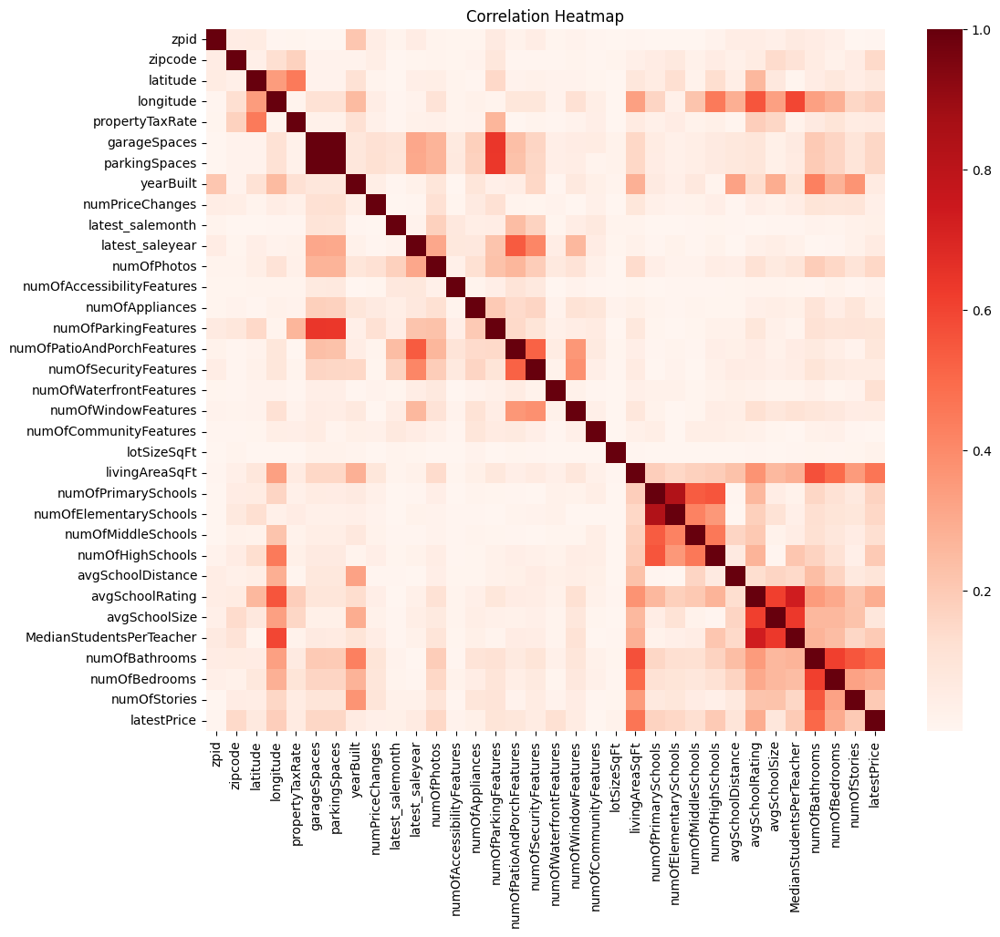

In [19]:
corr_matrix = numerical_data.corr().abs()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix,cmap='Reds')
plt.title("Correlation Heatmap")
plt.show()

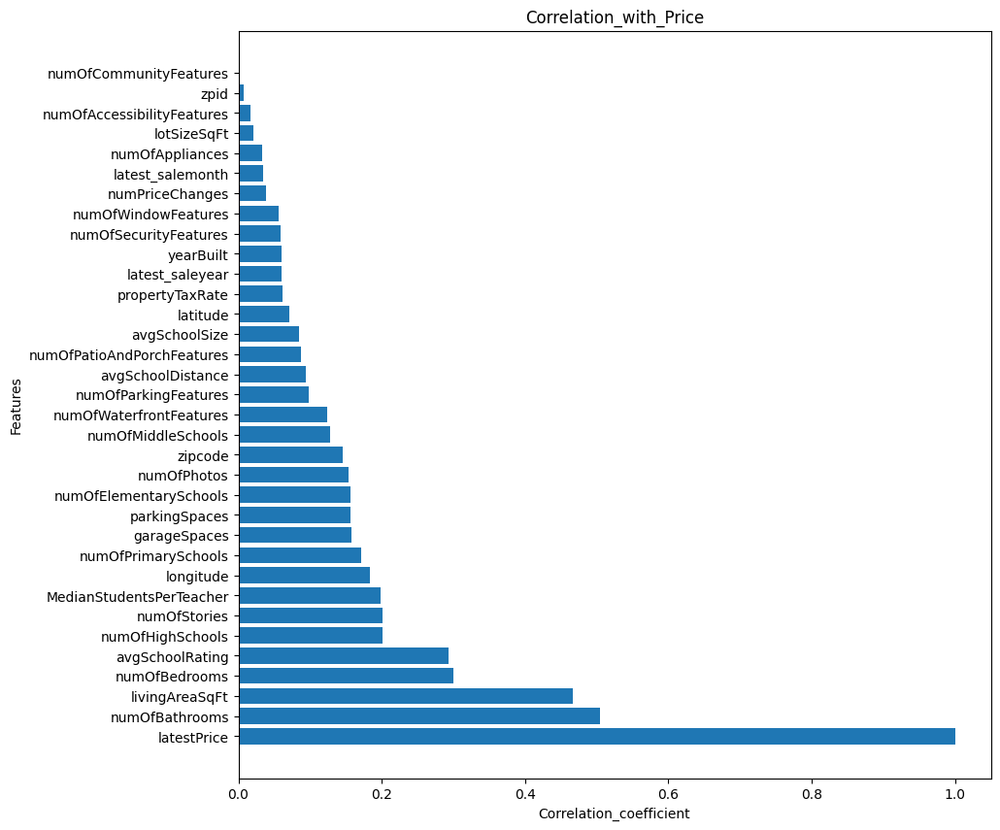

In [20]:
plt.figure(figsize=(10, 10))
corr_latestPrice = corr_matrix["latestPrice"].sort_values(ascending=False)
plt.barh(corr_latestPrice.index, corr_latestPrice)
plt.title("Correlation_with_Price")
plt.xlabel("Correlation_coefficient")
plt.ylabel("Features")
plt.show()


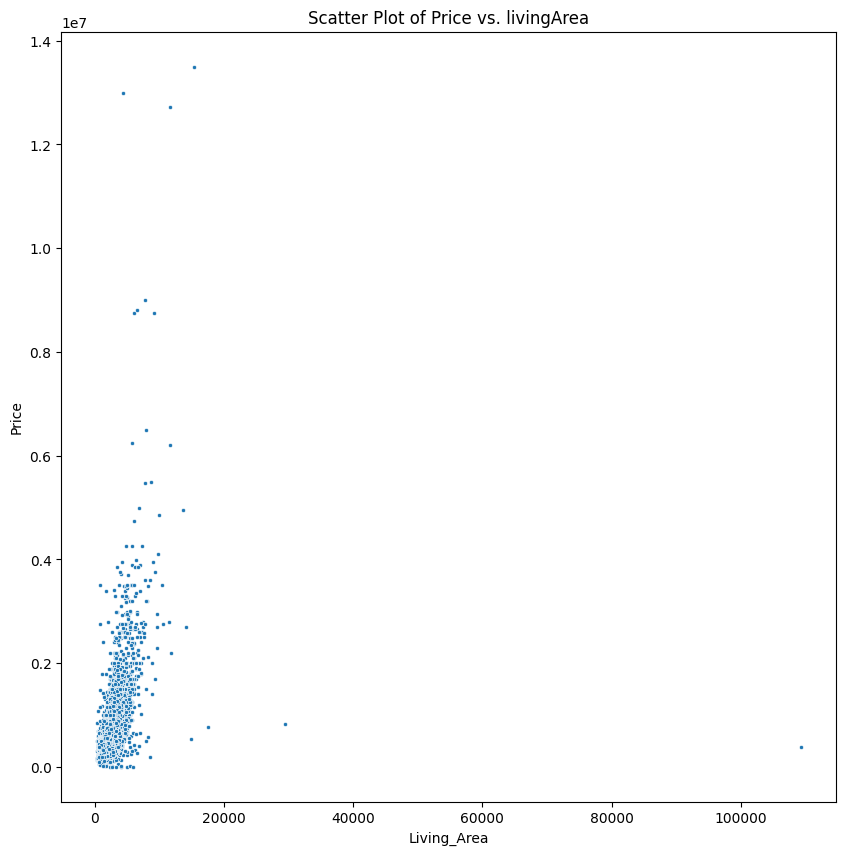

In [21]:
plt.figure(figsize=(10,10))
sns.scatterplot(x=data['livingAreaSqFt'], y=data['latestPrice'],marker='.')
plt.title('Scatter Plot of Price vs. livingArea')
plt.xlabel('Living_Area')
plt.ylabel('Price')
plt.show()

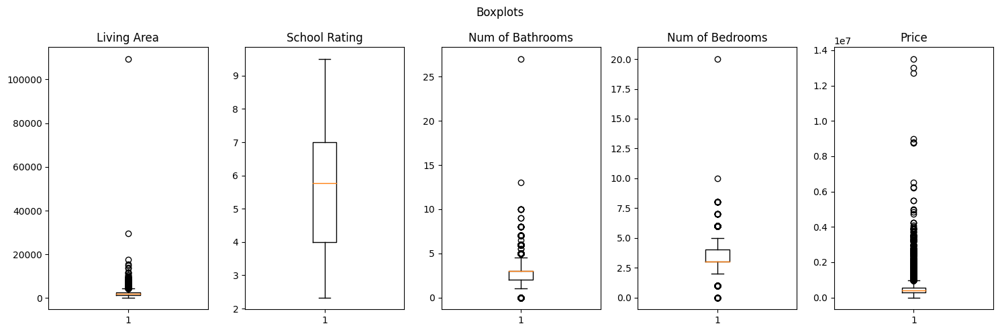

In [22]:
fig, axs = plt.subplots(1, 5, figsize=(15,5))

# Boxplot for livingAreaSqFt
axs[0].boxplot(data['livingAreaSqFt'])
axs[0].set_title("Living Area")

# Boxplot for avgSchoolRating
axs[1].boxplot(data['avgSchoolRating'])
axs[1].set_title("School Rating")

# Boxplot for numOfBathrooms
axs[2].boxplot(data['numOfBathrooms'])
axs[2].set_title("Num of Bathrooms")

# Boxplot for numOfBedrooms
axs[3].boxplot(data['numOfBedrooms'])
axs[3].set_title("Num of Bedrooms")

# Boxplot for latestsaleprice
axs[4].boxplot(data['latestPrice'])
axs[4].set_title("Price")
# Customize the figure
fig.suptitle("Boxplots")
plt.tight_layout()
plt.show()


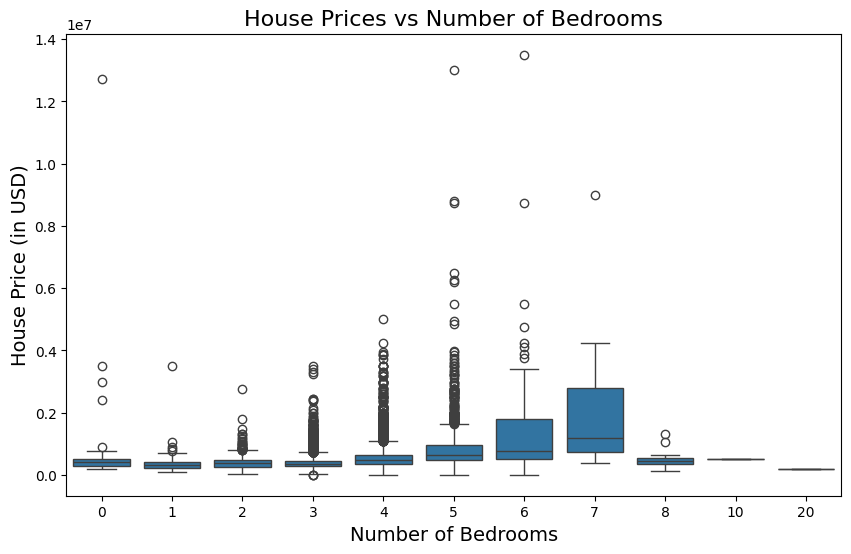

In [23]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='numOfBedrooms', y='latestPrice', data=data)

# Adding a regression line to show the overall trend
#sns.regplot(x='numOfBedrooms', y='latestPrice', data=data, scatter=False, ci=None, color='red')

# Customizing the plot
plt.title('House Prices vs Number of Bedrooms', fontsize=16)
plt.xlabel('Number of Bedrooms', fontsize=14)
plt.ylabel('House Price (in USD)', fontsize=14)

# Show the plot
plt.show()

Text(0, 0.5, 'Count')

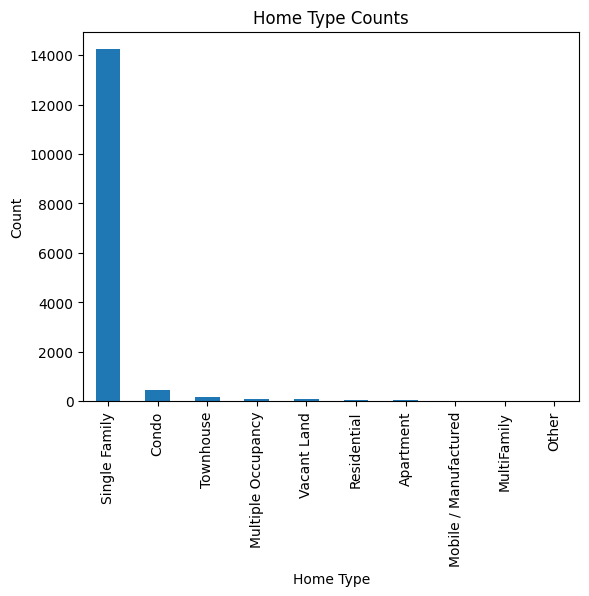

In [24]:
plt.subplot(1, 1, 1)
data['homeType'].value_counts().plot(kind='bar')
plt.title('Home Type Counts')
plt.xlabel('Home Type')
plt.ylabel('Count')


In [25]:
import folium
from branca.colormap import linear, LinearColormap
custom_colors = ['Yellow', 'Green', 'Blue', 'Red']
colormap = LinearColormap(custom_colors, vmin=0, vmax=100).scale(data['latestPrice'].min(), data['latestPrice'].max())
austin = folium.Map(location=[30.2672, -97.7431], zoom_start=11, tiles='cartodbpositron')
for _, row in data.iterrows():
    folium.Circle(location=[row['latitude'], row['longitude']],
                  color=colormap(row['latestPrice']),
                  radius=row['latestPrice']/9000, # adjust the size of the circle as needed
                  fill=True,
                  fill_color=colormap(row['latestPrice'])).add_to(austin)


colormap.caption = 'Housing Price $'
colormap.add_to(austin)

# Display the map
austin


In [26]:
from uszipcode import SearchEngine
avg_prices = data.groupby("zipcode")["latestPrice"].mean()
search = SearchEngine()
zipcodes = [search.by_zipcode(zipcode) for zipcode in avg_prices.index]
custom_colors = ['#2c7bb6', '#abd9e9', '#fdae61', '#d7191c']
colormap = LinearColormap(custom_colors, vmin=0, vmax=100).scale(avg_prices.min(), avg_prices.max())
austin_map = folium.Map(location=[30.2672, -97.7431], zoom_start=11, tiles="Cartodb Positron")
for zipcode in zipcodes:
    center_lat = zipcode.lat
    center_lon = zipcode.lng
    avg_price = avg_prices.get(float(zipcode.zipcode), 0)
    color = colormap(avg_price)
    folium.CircleMarker(
        location=[center_lat, center_lon],
        radius=15,
        fill=True,
        color=color,
        fill_opacity=0.5,
        tooltip="ZIP code: {}<br>Average price: ${:,.0f}".format(zipcode.zipcode, avg_price)
    ).add_to(austin_map)

austin_map

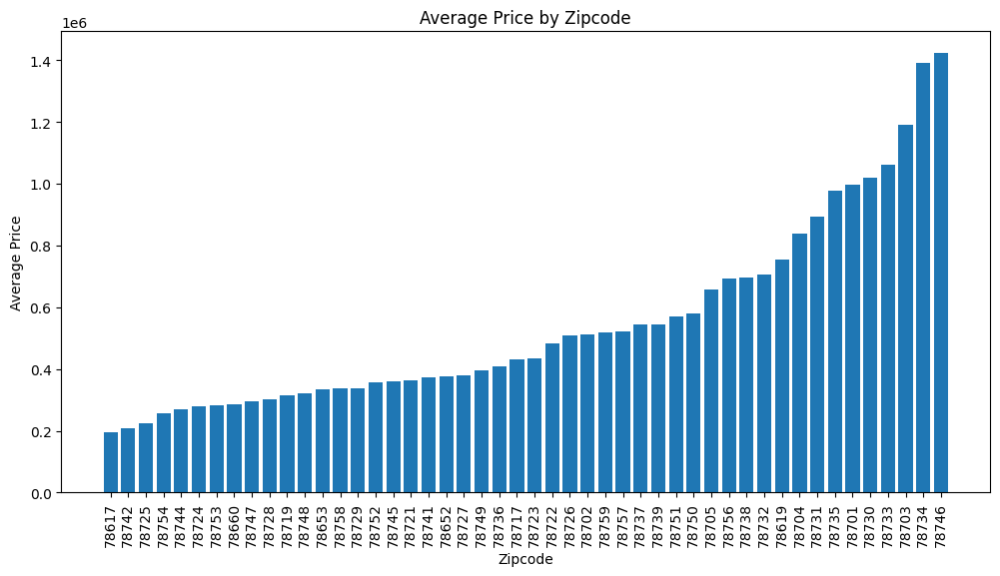

In [27]:
avg_price_by_zipcode = data.groupby('zipcode')['latestPrice'].mean().sort_values()
fig, ax = plt.subplots(figsize=(12,6))
ax.bar(avg_price_by_zipcode.index.astype(str), avg_price_by_zipcode.values)
ax.set_xlabel('Zipcode')
ax.set_ylabel('Average Price')
ax.set_title('Average Price by Zipcode')
plt.xticks(rotation=90)
plt.show()

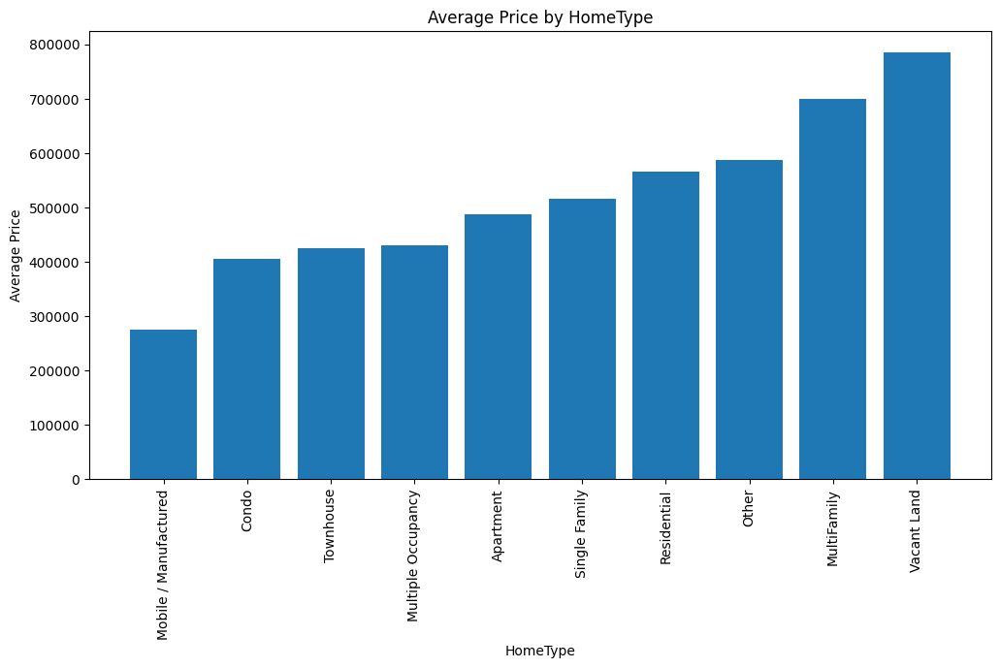

In [28]:
avg_price_by_zipcode = data.groupby('homeType')['latestPrice'].mean().sort_values()
fig, ax = plt.subplots(figsize=(12,6))
ax.bar(avg_price_by_zipcode.index.astype(str), avg_price_by_zipcode.values)
ax.set_xlabel('HomeType')
ax.set_ylabel('Average Price')
ax.set_title('Average Price by HomeType')
plt.xticks(rotation=90)
plt.show()

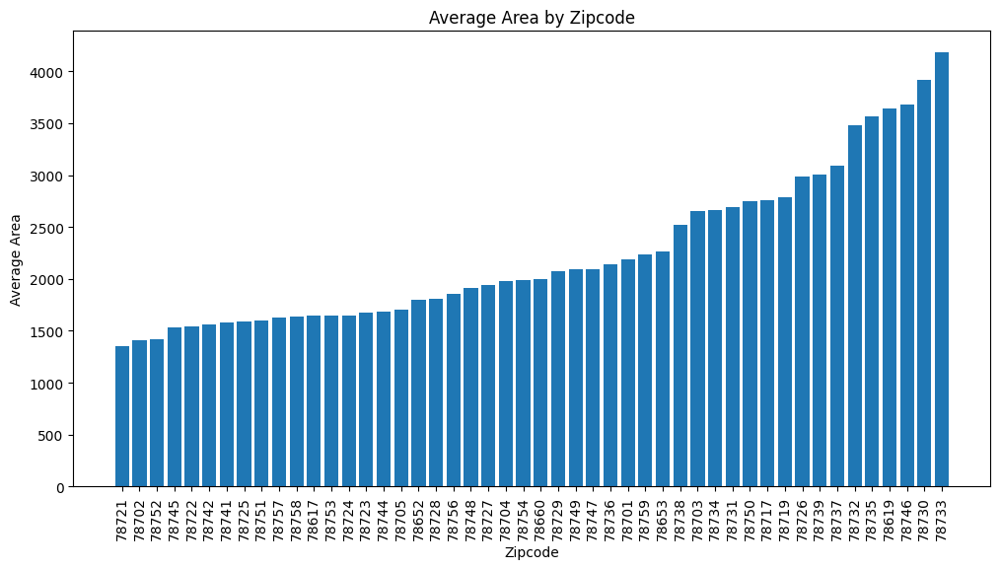

In [29]:
avg_price_by_zipcode = data.groupby('zipcode')['livingAreaSqFt'].mean().sort_values()
fig, ax = plt.subplots(figsize=(12,6))
ax.bar(avg_price_by_zipcode.index.astype(str), avg_price_by_zipcode.values)
ax.set_xlabel('Zipcode')
ax.set_ylabel('Average Area')
ax.set_title('Average Area by Zipcode')
plt.xticks(rotation=90)
plt.show()

([<matplotlib.patches.Wedge at 0x7f9f840b9120>,
 [Text(0.651492580860909, 0.8863167701692167, '\\$0 - \\$250K'),
  Text(-0.8850334146044438, 0.6532349156571462, '\\$250K - \\$400K'),
  Text(-0.16362473218159218, -1.0877623577870776, '\\$400K - \\$600K'),
  Text(0.9765825641460812, -0.5062474645920366, '\\$600K - \\$800K'),
  Text(1.0928084215078697, 0.12557768066610553, '\\$800K - \\$1.5M'),
  Text(0.9927187841281797, 0.47382424551627644, 'More than \\$1.5M')],
 [Text(0.3553595895604958, 0.4834455110013909, '13.2%'),
  Text(-0.4827454988751511, 0.35630995399480697, '36.8%'),
  Text(-0.0892498539172321, -0.593324922429315, '28.7%'),
  Text(0.5326813986251352, -0.2761349806865654, '10.8%'),
  Text(0.5960773208224743, 0.06849691672696664, '8.0%'),
  Text(0.5414829731608253, 0.2584495884634235, '2.5%')])

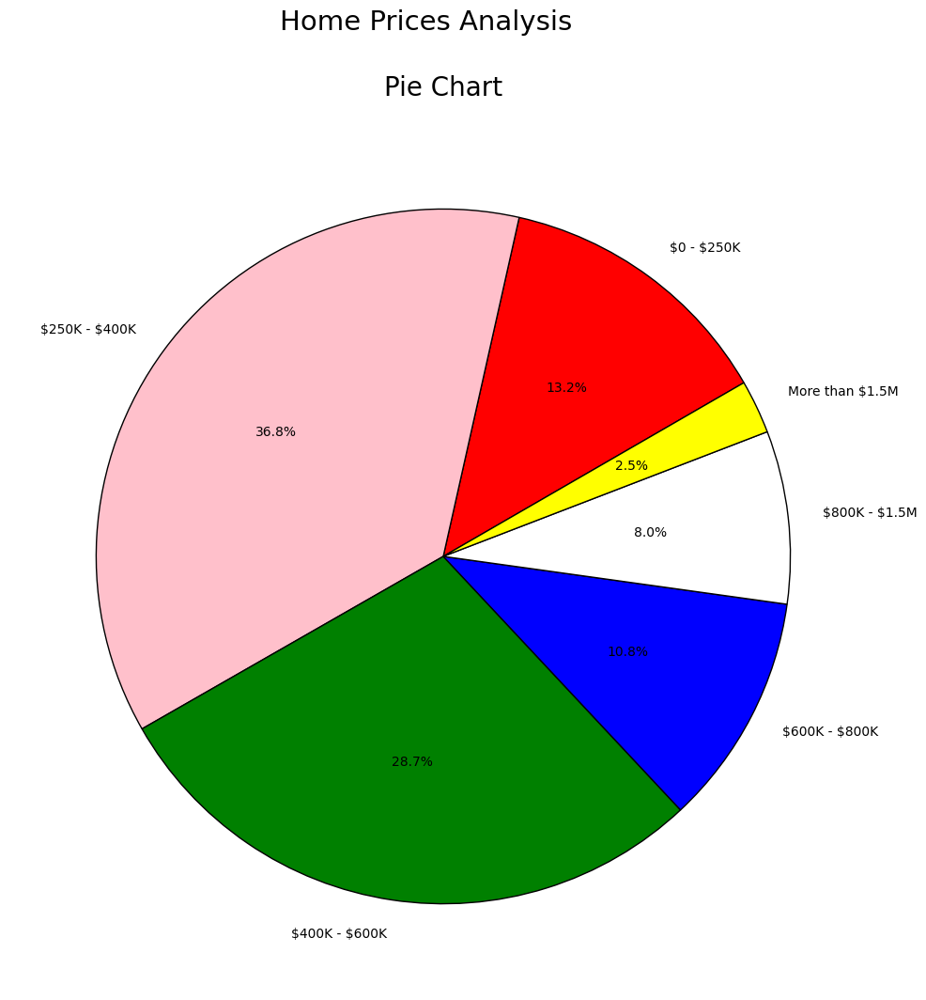

In [30]:
labels = ['\$0 - \$250K', '\$250K - \$400K', '\$400K - \$600K', '\$600K - \$800K', '\$800K - \$1.5M', 'More than \$1.5M']
colors = ['Red', 'Pink', 'Green', 'Blue', 'White', 'Yellow']
intervals = [0, 250000, 400000, 600000, 800000, 1500000, data['latestPrice'].max()]  # in $s
chart_slice_sizes = data.groupby(pd.cut(data['latestPrice'], intervals)).size().values
fig, ax = plt.subplots(figsize=(15,12))
fig.suptitle('Home Prices Analysis', size=21)
ax.set_title('Pie Chart', size=20, pad=20)
ax.pie(chart_slice_sizes, labels=labels, colors=colors, startangle=30, autopct='%1.1f%%',
        wedgeprops={'edgecolor': 'black'})